In [1]:
path='G:/Shared drives/BeStarsMiMeS/ScienceFiles/' #Patrick's google file stream path

import LSDpy
import specpolFlow as pol


import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
import astropy.constants as const
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
import itertools

import pyRaven as rav

In [2]:
#Accessing the google sheets

sheet_id = '1M6y1Wnsrc-w5FjUMfKaSFa_-foIDAaMe8W4lYNWnWyk'
sheet_name = 'Stars'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
StarData=pd.read_csv(url)

sheet_name = 'Observations'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
Observations=pd.read_csv(url)

Text(0.5, 1.0, 'hd58050 obs 1')

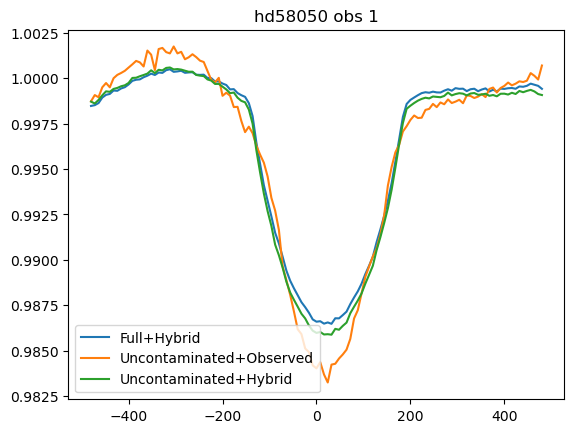

In [22]:
#star='hd173948'
#star='hd89884'
#star='hd37202'
star='hd58050'

#models1=['normalized_SuperCleanAsif+tellClean','hybrid_SuperCleanAsif+tellClean','hybrid_maskdepth0.02_tellClean']
ModelCode=StarData['ModelCode'][StarData['Name']==star].values[0].upper()
i=0
vsini=StarData['vsini-estimate'][StarData['Name']==star].values[0]


#get Full Mask with all lines
AFfile_mask='{}02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_{}_depth0.02.mask'.format(path,ModelCode,star)
AFmask = pol.read_mask(fname=AFfile_mask)
#get SuperClean Mask with all Lines
AUfile_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,i+1)

AUmask = pol.read_mask(fname=AUfile_mask)

#get observed spectra file
file = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,i+1)
data = pol.read_spectrum(file)
#get synthetic spectra file
synthfile = '{}01-Synth-calculations/Synth-hybrid-spectra/{}_{}_noise.s'.format(path,star,i+1)
synth = pol.read_spectrum(synthfile)


outfileFH='{}03-LSD-calculations/LSD/hybrid_maskdepth0.02_tellClean/{}_{}.lsd'.format(path,star,i+1)

outfileUN='{}03-LSD-calculations/LSD/normalized_SuperCleanAsif+tellClean/{}_{}.lsd'.format(path,star,i+1)
outfileUH='{}03-LSD-calculations/LSD/hybrid_SuperCleanAsif+tellClean/{}_{}.lsd'.format(path,star,i+1)

FH=pol.read_lsd(outfileFH)
UN=pol.read_lsd(outfileUN)
UH=pol.read_lsd(outfileUH)

plt.plot(FH.vel,FH.specI,label='Full+Hybrid')
plt.plot(UN.vel,UN.specI,label='Uncontaminated+Observed')
plt.plot(UH.vel,UH.specI,label='Uncontaminated+Hybrid')
plt.legend()
plt.title('{} obs {}'.format(star,i+1))


In [6]:
out='{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/emissionclean/{}_{}_emissionclean.mask'.format(path,star,i+1)
#pol.cleanMaskUI(AFmask,file,out)

pol.cleanMaskUI(AUmask,file,out)
#pol.cleanMaskUI(out,file,out)

Generating test LSD profile...
Average observed spec velocity spacing: 1.780078 km/s
using a 227 point profile with 1.770000 km/s pixels
mean mask depth 0.109522 wl 490.363 Lande 1.198622 (from 571 lines)
mean mask norm weightI 0.547609 weightV 0.523150
saving model spectrum to  ...
I reduced chi2 106.8733 (chi2 6414106.98 constraints 60243 dof 227)
 Rescaling error bars by: 10.337954
V reduced chi2 0.8962 (chi2 53786.51 constraints 60243 dof 227)
 Not rescaling error bars (scale 0.946680)
 removing profile continuum pol: -1.4600e-05 +/- 1.5754e-08 (avg err 1.2528e-04)
N1 reduced chi2 0.8993 (chi2 53972.60 constraints 60243 dof 227)
 Not rescaling error bars (scale 0.948316)
 removing profile continuum pol: -1.3879e-05 +/- 1.5754e-08 (avg err 1.2528e-04)
line range estimate -93.79999999999939 143.38000000000198 km/s
V in line reduced chi^2 0.828062 (chi2 110.132218) 
 detect prob 0.073511 (fap 9.264893e-01)
 Non-detection V (fap 9.264893e-01)
 V outside line reduced chi^2 0.856996 (chi

(<specpolFlow.mask.Mask at 0x250fa75cc90>,
 <specpolFlow.mask.ExcludeMaskRegions at 0x25084692110>)

In [ ]:
correctedEmission=['hd58050','hd72067','hd120324','hd198183','hd203467']

Modified line mask, removed 72 too closely spaced lines
Average observed spec velocity spacing: 1.780120 km/s
using a 121 point profile with 8.000000 km/s pixels
mean mask depth 0.118796 wl 495.239 Lande 1.212495 (from 499 lines)
mean mask norm weightI 0.593978 weightV 0.568858
saving model spectrum to  ...
I reduced chi2 50.9558 (chi2 4052416.42 constraints 79649 dof 121)
 Rescaling error bars by: 7.138336
V reduced chi2 0.8954 (chi2 71210.87 constraints 79649 dof 121)
 Not rescaling error bars (scale 0.946266)
 removing profile continuum pol: -1.1526e-05 +/- 4.1468e-09 (avg err 6.4303e-05)
N1 reduced chi2 0.9002 (chi2 71592.47 constraints 79649 dof 121)
 Not rescaling error bars (scale 0.948798)
 removing profile continuum pol: -1.1330e-05 +/- 4.1468e-09 (avg err 6.4303e-05)
(possible Stokes I uncertainty underestimate 6.1470e-04 vs 4.5547e-04)
line range estimate -128.0 176.0 km/s
V in line reduced chi^2 1.168470 (chi2  44.401875) 
 detect prob 0.780028 (fap 2.199716e-01)
 Non-detec

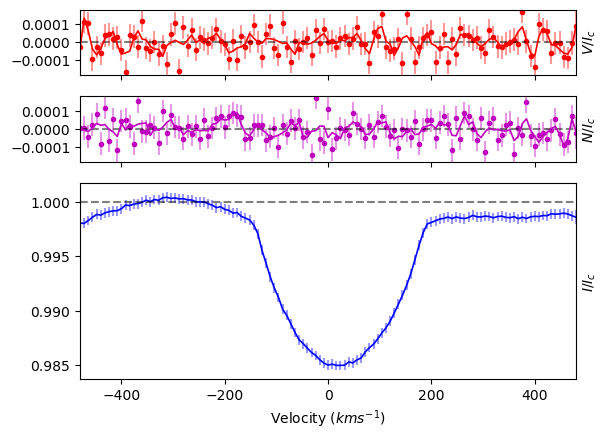

Text(0.5, 1.0, 'hd58050 obs 1')

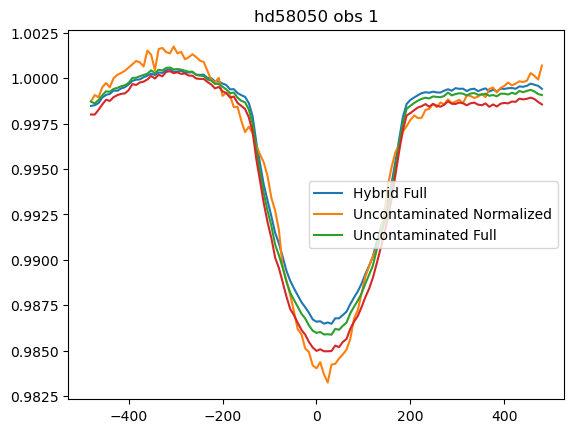

In [19]:
i=0
df = pd.read_csv('{}03-LSD-calculations/LSD/Params-LSDProfiles-CalculatedByPython.csv'.format(path))
velS = df["VelStart"][np.where(StarData['Name']==star)[0][0]]
velE = df["VelEnd"][np.where(StarData['Name']==star)[0][0]]
velP = df["VelPixel"][np.where(StarData['Name']==star)[0][0]]
out='{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/emissionclean/{}_{}_emissionclean.mask'.format(path,star,i+1)
outfile='{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/emissionclean/{}_{}_emissionclean.lsd'.format(path,star,i+1)
new=pol.run_lsdpy(obs = synthfile, mask = '{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}_original.mask'.format(path,star,i+1), outLSDName = outfile, 
            velStart = velS, velEnd = velE, velPixel = velP, 
            normDepth = 0.2, normLande = 1.2, normWave = 500.0)
newnew=pol.read_lsd(outfile)

FH=pol.read_lsd(outfileFH)
UN=pol.read_lsd(outfileUN)
UH=pol.read_lsd(outfileUH)
newnew=pol.read_lsd(outfile)
plt.plot(FH.vel,FH.specI,label='Hybrid Full')
plt.plot(UN.vel,UN.specI,label='Uncontaminated Normalized')
plt.plot(UH.vel,UH.specI,label='Uncontaminated Full')
plt.plot(newnew.vel,newnew.specI)

plt.legend()
plt.title('{} obs {}'.format(star,i+1))


NameError: name 'e' is not defined

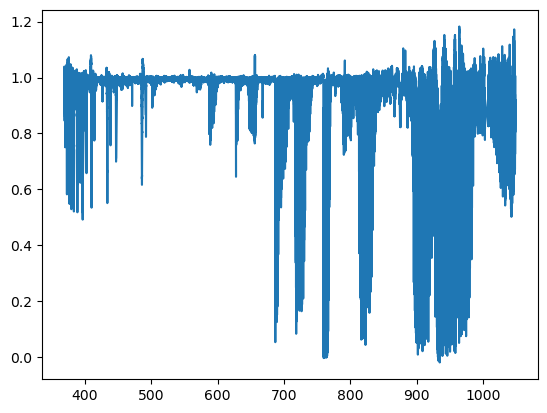

In [8]:
file = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,i+1)
data = pol.read_spectrum(file)

#file2 = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,2)
#data2 = pol.read_spectrum(file2)

AUfile_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,i+1)
AUmask = pol.read_mask(fname=AUfile_mask)



plt.plot(data.wl,data.specI)
#plt.plot(data2.wl,data2.specI)
#e=16.01
#e=26.02

plt.vlines(AUmask.wl[np.where((AUmask.element==e) & (AUmask.iuse==1))],1-AUmask.depth[np.where((AUmask.element==e) & (AUmask.iuse==1))],1,color='green')
#plt.vlines(AUmask.wl[np.where(AUmask.element==1.)],1-AUmask.depth[np.where(AUmask.element==1.)],1,color='r')
plt.ylim(0.9,1.1)
plt.xlim(515,525)
#plt.xlim(432,437)
#plt.xlim(454,456)
plt.title('{} obs {}'.format(star,i+1))
plt.show()

In [38]:
for j in range(len(StarData['Name'])):
    star=StarData['Name'][j]
    
    if StarData['Nobs'][j]>1:
        for i in range(StarData['Nobs'][j]-1):
            AUfile_mask='{}00-InputMaterial/AsifMaskClean/{}_clean_{}.mask'.format(path,star,i+1)
            AUmask = pol.read_mask(fname=AUfile_mask)
            AUfile_mask1='{}00-InputMaterial/AsifMaskClean/{}_clean_{}.mask'.format(path,star,i+2)
            AUmask1 = pol.read_mask(fname=AUfile_mask1)
        
            print(star,AUmask.wl[np.where(AUmask.iuse==1)].all()==AUmask1.wl[np.where(AUmask1.iuse==1)].all())

hd7636 True
hd22192 True
hd23302 True
hd32343 True
hd32991 True
hd35411 True
hd35411 True
hd37202 True
hd50209 True
hd50209 True
hd50209 True
hd50209 True
hd50209 True
hd52918 True
hd52918 True
hd52918 True
hd58050 True
hd58343 True
hd58715 True
hd58715 True
hd58715 True
hd58715 True
hd58715 True
hd65875 True
hd65875 True
hd109387 True
hd109387 True
hd109387 True
hd109387 True
hd109387 True
hd109387 True
hd109387 True
hd109387 True
hd138749 True
hd138749 True
hd138749 True
hd143275 True
hd143275 True
hd148184 True
hd148184 True
hd148184 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd164284 True
hd170783 True
hd170783 True
hd170783 True
hd170783 True
hd170783 True
hd170783 True
hd170783 True
hd170783 True
hd170783 True
hd175869 True
hd175869 True
hd175869 True
hd17

In [36]:
star='hd7636'
i=0
AUfile_mask='{}00-InputMaterial/AsifMaskClean/{}_clean_{}.mask'.format(path,star,i+1)
AUmask = pol.read_mask(fname=AUfile_mask)
AUfile_mask1='{}00-InputMaterial/AsifMaskClean/{}_clean_{}.mask'.format(path,star,i+2)
AUmask1 = pol.read_mask(fname=AUfile_mask1)
AUmask.wl[np.where(AUmask.iuse==1)].all()==AUmask1.wl[np.where(AUmask1.iuse==1)].all()

True

C:\Users\pjsta\AppData\Local\Temp\ipykernel_21852\1239524475.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(10,5))


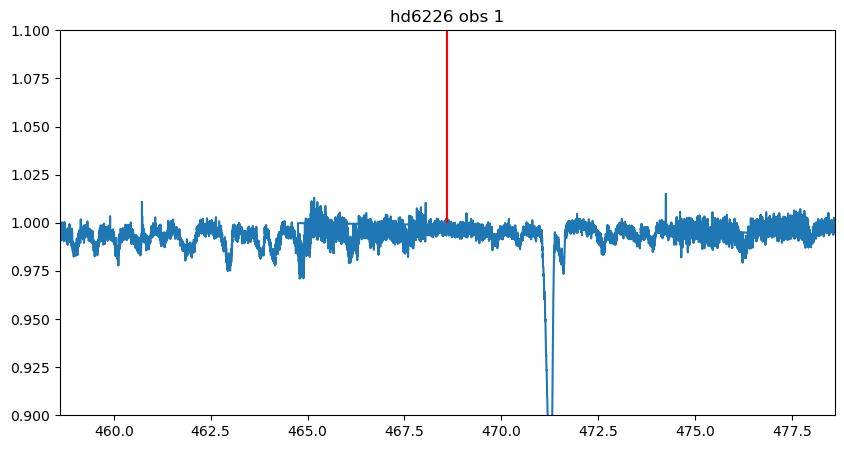

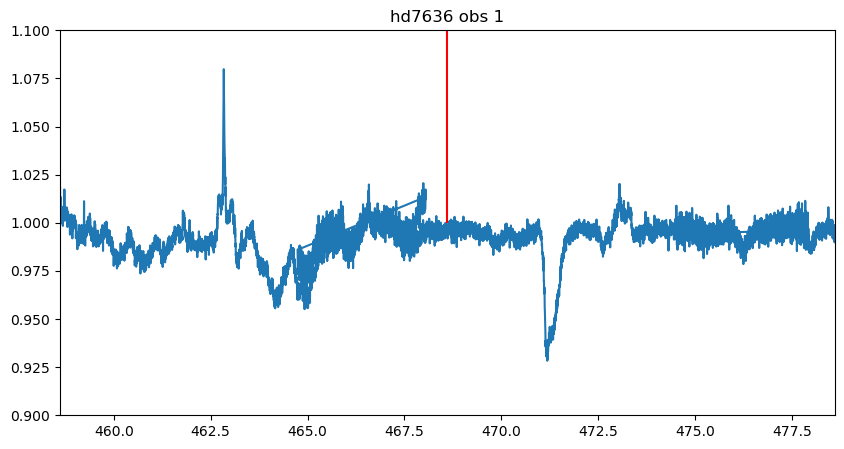

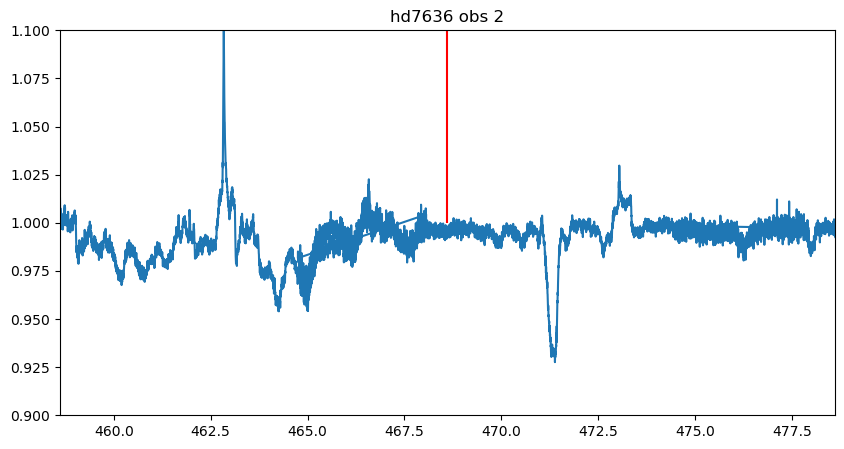

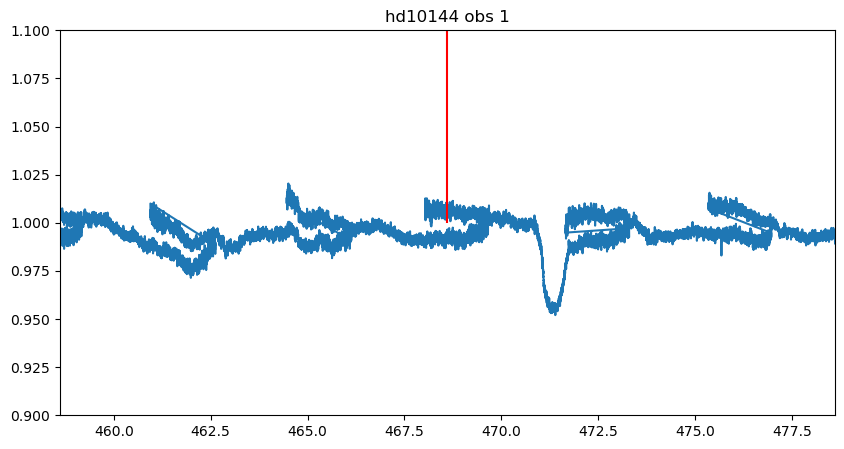

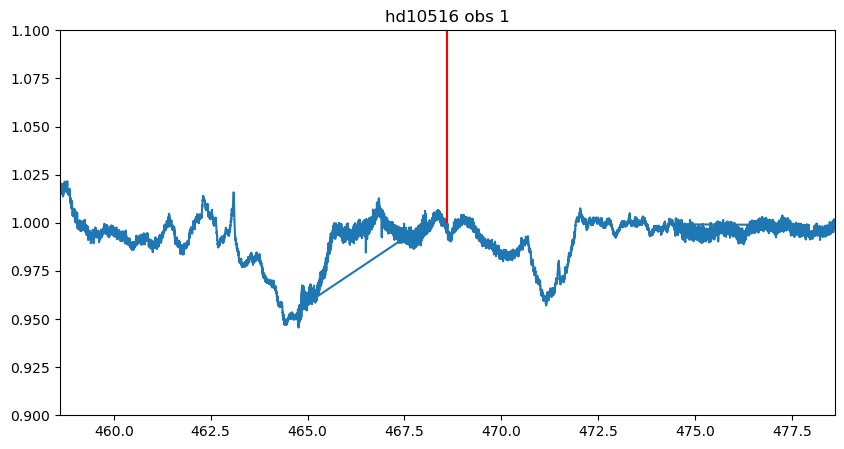

...

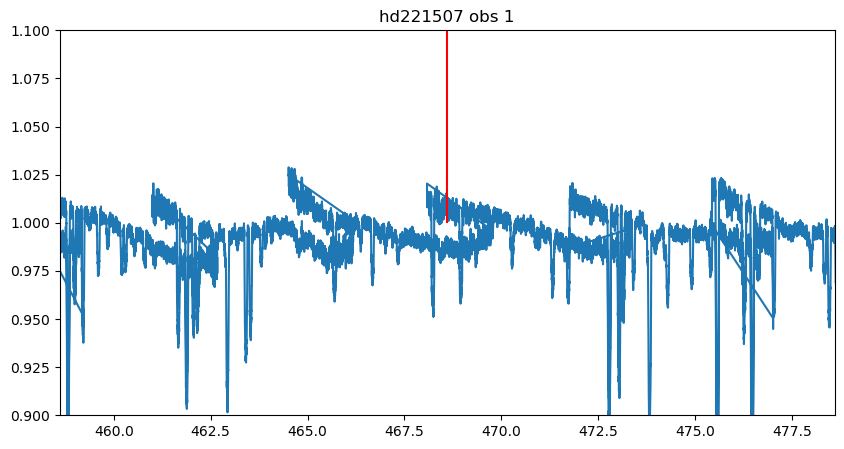

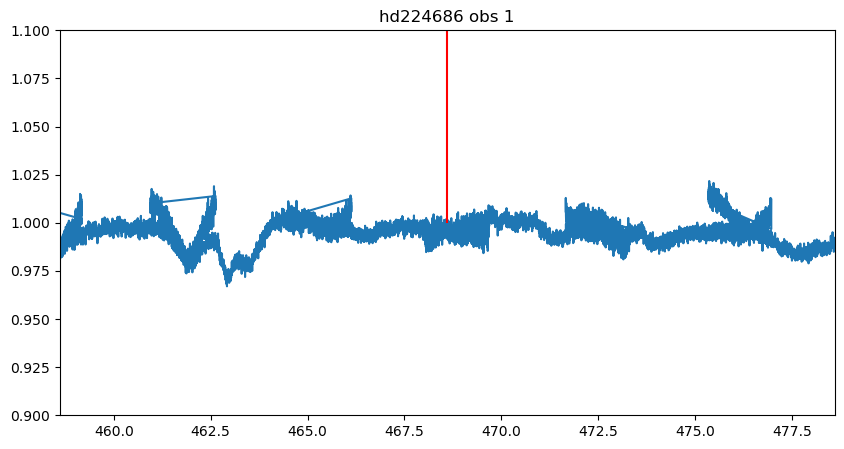

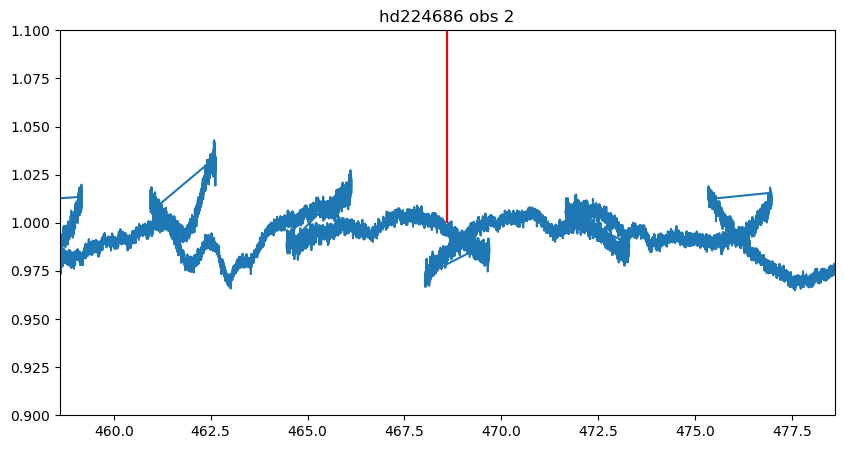

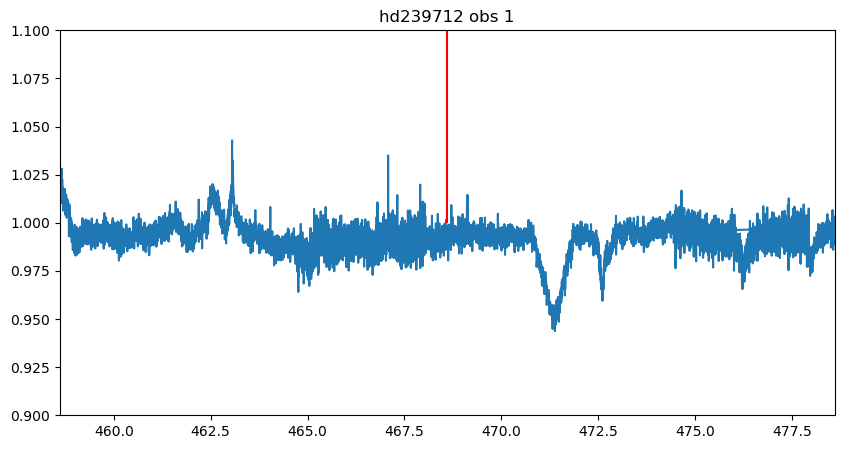

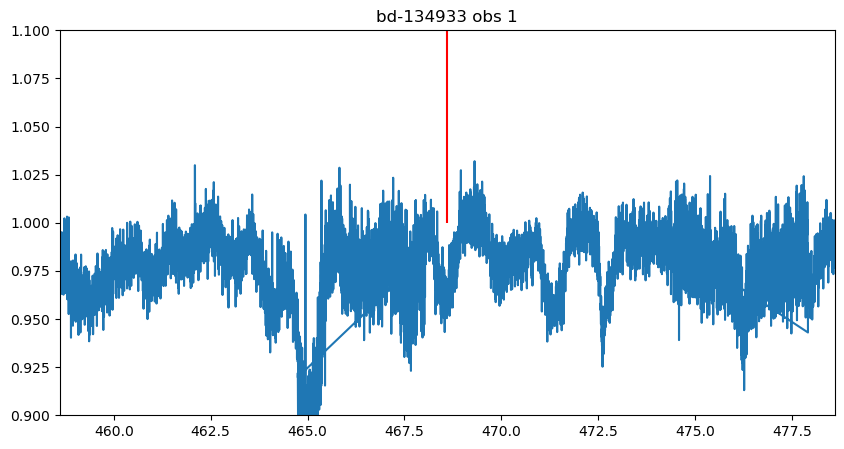

In [3]:
with PdfPages('{}HeII4648_all.pdf'.format(path)) as pdf:
    for j in range(len(StarData['Name'])):
        star=StarData['Name'][j]
        
        for i in range(StarData['Nobs'][j]):

            file = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,i+1)
            data = pol.read_spectrum(file)

            #file2 = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,2)
            #data2 = pol.read_spectrum(file2)

            AUfile_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,i+1)
            AUmask = pol.read_mask(fname=AUfile_mask)


            fig, ax = plt.subplots(1,1, figsize=(10,5))
            ax.plot(data.wl,data.specI)
            #plt.plot(data2.wl,data2.specI)
            #plt.vlines(AUmask.wl[np.where((AUmask.element==26.01) & (AUmask.iuse==1))],1-AUmask.depth[np.where((AUmask.element==26.01) & (AUmask.iuse==1))],1,color='green')
            #plt.vlines(AUmask.wl[np.where(AUmask.element==1.)],1-AUmask.depth[np.where(AUmask.element==1.)],1,color='r')
            ax.set_ylim(0.9,1.1)
            ax.set_xlim(468.6-10,468.6+10)
            ax.vlines(468.6,1,1.1,color='r')
            #plt.xlim(432,437)
            ax.set_title('{} obs {}'.format(star,i+1))
            pdf.savefig(fig)

In [39]:
AUmask.element[np.where((AUmask.wl>=432) & (AUmask.wl<=437))]

array([ 6.01,  6.01, 26.02,  8.01,  6.01, 14.02,  6.01,  8.01,  8.01,
        8.01,  8.01, 16.01,  6.01,  6.01,  6.01, 16.01, 18.01,  8.01,
        8.01, 12.01, 12.01, 18.01, 16.02, 16.01, 26.02, 26.02,  8.01,
       14.02, 16.02,  1.  , 14.02, 17.01, 26.02,  8.01,  8.01,  8.01,
       18.01, 26.02,  8.01,  8.01,  8.01, 26.01, 18.01, 26.02, 26.01,
       16.02, 26.01,  8.01, 28.02, 16.02, 16.02, 26.02,  8.01, 18.01,
        6.01,  8.  ,  8.  ,  6.01,  6.01,  8.01,  6.01])